#### https://gallery.azure.ai/Experiment/Predictive-Maintenance-Step-1-of-3-data-preparation-and-feature-engineering-2

#### https://www.kaggle.com/behrad3d/nasa-cmaps

In [104]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix,accuracy_score


In [105]:

import os, types
import pandas as pd
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.

if os.environ.get('RUNTIME_ENV_LOCATION_TYPE') == 'external':
    endpoint_6ccecd4e88ba4147b4cdd4c0c4c73a40 = 'https://s3.us.cloud-object-storage.appdomain.cloud'
else:
    endpoint_6ccecd4e88ba4147b4cdd4c0c4c73a40 = 'https://s3.private.us.cloud-object-storage.appdomain.cloud'

client_6ccecd4e88ba4147b4cdd4c0c4c73a40 = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='5Q1sVRM4_gIXvQXrJYEkbzpcCMAU1n7A_msMsgOBZ_Z5',
    ibm_auth_endpoint="https://iam.cloud.ibm.com/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url=endpoint_6ccecd4e88ba4147b4cdd4c0c4c73a40)

body = client_6ccecd4e88ba4147b4cdd4c0c4c73a40.get_object(Bucket='miniproject-donotdelete-pr-11pvjxajo3trpk',Key='PM_train.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

dataset_train = pd.read_csv(body)
dataset_train.head()


,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s12,s13,s14,s15,s16,s17,s18,s19,s20,s21
0,1,1,-0.0007,-0.0004,100,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100,39.06,23.4190
1,1,2,0.0019,-0.0003,100,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100,39.00,23.4236
2,1,3,-0.0043,0.0003,100,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100,38.95,23.3442
3,1,4,0.0007,0.0000,100,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100,38.88,23.3739
4,1,5,-0.0019,-0.0002,100,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100,38.90,23.4044


In [106]:
dataset_train['id'].value_counts()

69    362
92    341
96    336
67    313
83    293
     ... 
24    147
57    137
70    137
91    135
39    128
Name: id, Length: 100, dtype: int64

In [107]:

body = client_6ccecd4e88ba4147b4cdd4c0c4c73a40.get_object(Bucket='miniproject-donotdelete-pr-11pvjxajo3trpk',Key='PM_test.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

dataset_test = pd.read_csv(body)
dataset_test.head()


,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s12,s13,s14,s15,s16,s17,s18,s19,s20,s21
0,1,1,0.0023,0.0003,100,518.67,643.02,1585.29,1398.21,14.62,...,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100,38.86,23.3735
1,1,2,-0.0027,-0.0003,100,518.67,641.71,1588.45,1395.42,14.62,...,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100,39.02,23.3916
2,1,3,0.0003,0.0001,100,518.67,642.46,1586.94,1401.34,14.62,...,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100,39.08,23.4166
3,1,4,0.0042,0.0000,100,518.67,642.44,1584.12,1406.42,14.62,...,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100,39.00,23.3737
4,1,5,0.0014,0.0000,100,518.67,642.51,1587.19,1401.92,14.62,...,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100,38.99,23.4130


In [108]:

body = client_6ccecd4e88ba4147b4cdd4c0c4c73a40.get_object(Bucket='miniproject-donotdelete-pr-11pvjxajo3trpk',Key='PM_truth.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

pm_truth = pd.read_csv(body)
pm_truth.head()


,more,id
0,112,1
1,98,2
2,69,3
3,82,4
4,91,5


In [109]:
pm_truth.shape

(100, 2)

In [110]:
rul = pd.DataFrame(dataset_test.groupby('id')['cycle'].max()).reset_index()
rul.columns = ['id', 'max']
rul.head()

,id,max
0,1,31
1,2,49
2,3,126
3,4,106
4,5,98


In [111]:
rul.shape

(100, 2)

In [112]:
pm_truth['rtf']=pm_truth['more']+rul['max']
pm_truth.head()

,more,id,rtf
0,112,1,143
1,98,2,147
2,69,3,195
3,82,4,188
4,91,5,189


In [113]:
pm_truth.shape

(100, 3)

In [114]:
pm_truth.drop('more', axis=1, inplace=True)
dataset_test=dataset_test.merge(pm_truth,on=['id'],how='left')
dataset_test['ttf']=dataset_test['rtf'] - dataset_test['cycle']
dataset_test.drop('rtf', axis=1, inplace=True)
dataset_test.head()

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s13,s14,s15,s16,s17,s18,s19,s20,s21,ttf
0,1,1,0.0023,0.0003,100,518.67,643.02,1585.29,1398.21,14.62,...,2388.03,8125.55,8.4052,0.03,392,2388,100,38.86,23.3735,142
1,1,2,-0.0027,-0.0003,100,518.67,641.71,1588.45,1395.42,14.62,...,2388.06,8139.62,8.3803,0.03,393,2388,100,39.02,23.3916,141
2,1,3,0.0003,0.0001,100,518.67,642.46,1586.94,1401.34,14.62,...,2388.03,8130.10,8.4441,0.03,393,2388,100,39.08,23.4166,140
3,1,4,0.0042,0.0000,100,518.67,642.44,1584.12,1406.42,14.62,...,2388.05,8132.90,8.3917,0.03,391,2388,100,39.00,23.3737,139
4,1,5,0.0014,0.0000,100,518.67,642.51,1587.19,1401.92,14.62,...,2388.03,8129.54,8.4031,0.03,390,2388,100,38.99,23.4130,138


In [115]:
dataset_test.shape

(13096, 27)

In [116]:
dataset_train['ttf'] = dataset_train.groupby(['id'])['cycle'].transform(max)-dataset_train['cycle']
dataset_train.head()

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s13,s14,s15,s16,s17,s18,s19,s20,s21,ttf
0,1,1,-0.0007,-0.0004,100,518.67,641.82,1589.70,1400.60,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100,39.06,23.4190,191
1,1,2,0.0019,-0.0003,100,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100,39.00,23.4236,190
2,1,3,-0.0043,0.0003,100,518.67,642.35,1587.99,1404.20,14.62,...,2388.03,8133.23,8.4178,0.03,390,2388,100,38.95,23.3442,189
3,1,4,0.0007,0.0000,100,518.67,642.35,1582.79,1401.87,14.62,...,2388.08,8133.83,8.3682,0.03,392,2388,100,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,100,518.67,642.37,1582.85,1406.22,14.62,...,2388.04,8133.80,8.4294,0.03,393,2388,100,38.90,23.4044,187


In [117]:
dataset_train.shape

(20631, 27)

In [118]:
dataset_train['ttf'].value_counts()

0      100
87     100
118    100
14     100
31     100
      ... 
361      1
346      1
347      1
348      1
351      1
Name: ttf, Length: 362, dtype: int64

In [119]:
df_train=dataset_train.copy()
df_test=dataset_test.copy()
period=30
df_train['label_bc'] = df_train['ttf'].apply(lambda x: 1 if x <= period else 0)
df_test['label_bc'] = df_test['ttf'].apply(lambda x: 1 if x <= period else 0)
df_train.head()

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s14,s15,s16,s17,s18,s19,s20,s21,ttf,label_bc
0,1,1,-0.0007,-0.0004,100,518.67,641.82,1589.70,1400.60,14.62,...,8138.62,8.4195,0.03,392,2388,100,39.06,23.4190,191,0
1,1,2,0.0019,-0.0003,100,518.67,642.15,1591.82,1403.14,14.62,...,8131.49,8.4318,0.03,392,2388,100,39.00,23.4236,190,0
2,1,3,-0.0043,0.0003,100,518.67,642.35,1587.99,1404.20,14.62,...,8133.23,8.4178,0.03,390,2388,100,38.95,23.3442,189,0
3,1,4,0.0007,0.0000,100,518.67,642.35,1582.79,1401.87,14.62,...,8133.83,8.3682,0.03,392,2388,100,38.88,23.3739,188,0
4,1,5,-0.0019,-0.0002,100,518.67,642.37,1582.85,1406.22,14.62,...,8133.80,8.4294,0.03,393,2388,100,38.90,23.4044,187,0


In [120]:
df_train['label_bc'].value_counts()

0    17531
1     3100
Name: label_bc, dtype: int64

In [121]:
features_col_name=['setting1', 'setting2', 'setting3', 's1', 's2', 's3', 's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11',
                   's12', 's13', 's14', 's15', 's16', 's17', 's18', 's19', 's20', 's21']
target_col_name='label_bc'

In [122]:
sc=MinMaxScaler()
df_train[features_col_name]=sc.fit_transform(df_train[features_col_name])
df_test[features_col_name]=sc.transform(df_test[features_col_name])

In [123]:
df_train.head()

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s14,s15,s16,s17,s18,s19,s20,s21,ttf,label_bc
0,1,1,0.459770,0.166667,0.0,0.0,0.183735,0.406802,0.309757,0.0,...,0.199608,0.363986,0.0,0.333333,0.0,0.0,0.713178,0.724662,191,0
1,1,2,0.609195,0.250000,0.0,0.0,0.283133,0.453019,0.352633,0.0,...,0.162813,0.411312,0.0,0.333333,0.0,0.0,0.666667,0.731014,190,0
2,1,3,0.252874,0.750000,0.0,0.0,0.343373,0.369523,0.370527,0.0,...,0.171793,0.357445,0.0,0.166667,0.0,0.0,0.627907,0.621375,189,0
3,1,4,0.540230,0.500000,0.0,0.0,0.343373,0.256159,0.331195,0.0,...,0.174889,0.166603,0.0,0.333333,0.0,0.0,0.573643,0.662386,188,0
4,1,5,0.390805,0.333333,0.0,0.0,0.349398,0.257467,0.404625,0.0,...,0.174734,0.402078,0.0,0.416667,0.0,0.0,0.589147,0.704502,187,0


In [124]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 28 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        20631 non-null  int64  
 1   cycle     20631 non-null  int64  
 2   setting1  20631 non-null  float64
 3   setting2  20631 non-null  float64
 4   setting3  20631 non-null  float64
 5   s1        20631 non-null  float64
 6   s2        20631 non-null  float64
 7   s3        20631 non-null  float64
 8   s4        20631 non-null  float64
 9   s5        20631 non-null  float64
 10  s6        20631 non-null  float64
 11  s7        20631 non-null  float64
 12  s8        20631 non-null  float64
 13  s9        20631 non-null  float64
 14  s10       20631 non-null  float64
 15  s11       20631 non-null  float64
 16  s12       20631 non-null  float64
 17  s13       20631 non-null  float64
 18  s14       20631 non-null  float64
 19  s15       20631 non-null  float64
 20  s16       20631 non-null  fl

In [125]:
df_train['ttf'].min()

0

In [126]:
df_train['ttf'].max()

361

In [127]:
df_train.iloc[0,:]

id            1.000000
cycle         1.000000
setting1      0.459770
setting2      0.166667
setting3      0.000000
s1            0.000000
s2            0.183735
s3            0.406802
s4            0.309757
s5            0.000000
s6            1.000000
s7            0.726248
s8            0.242424
s9            0.109755
s10           0.000000
s11           0.369048
s12           0.633262
s13           0.205882
s14           0.199608
s15           0.363986
s16           0.000000
s17           0.333333
s18           0.000000
s19           0.000000
s20           0.713178
s21           0.724662
ttf         191.000000
label_bc      0.000000
Name: 0, dtype: float64

In [128]:
df_train.columns

Index(['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
       's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
       's15', 's16', 's17', 's18', 's19', 's20', 's21', 'ttf', 'label_bc'],
      dtype='object')

# Pair plot usually gives pair wise relationships of the columns in the dataset 

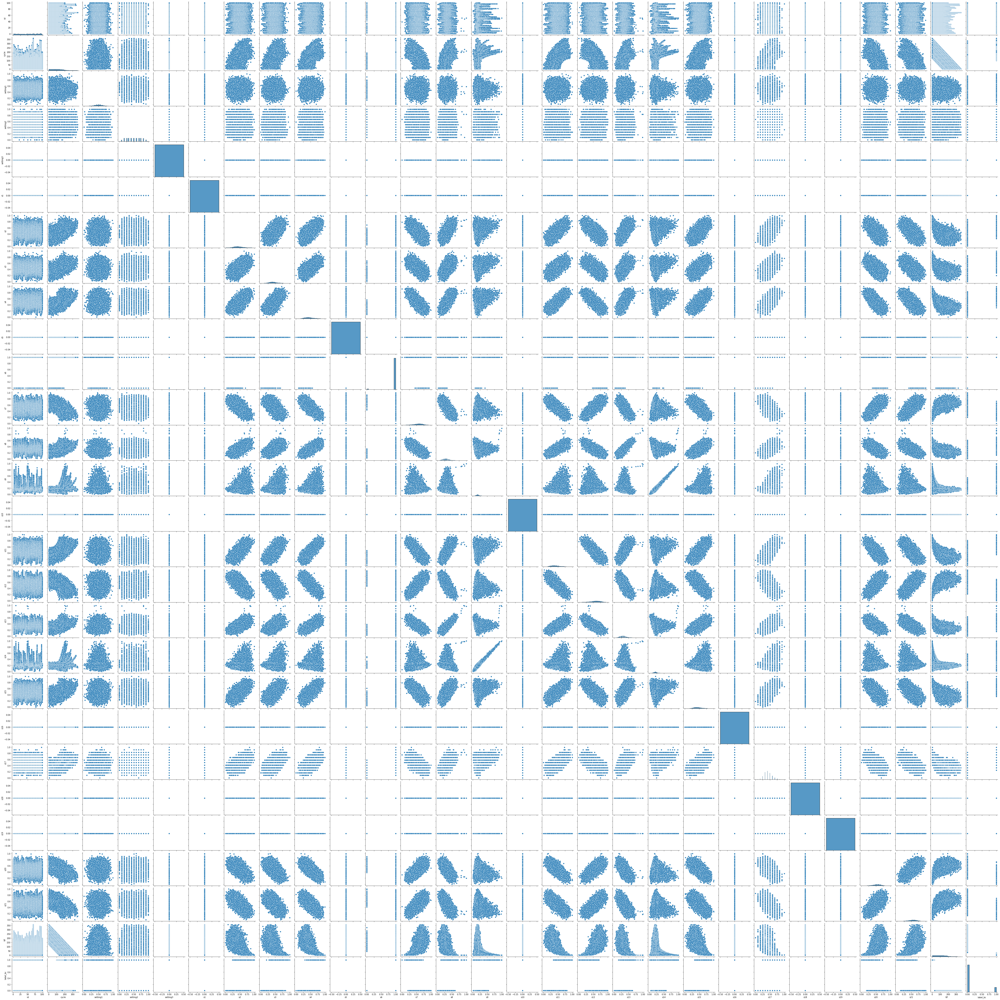

In [33]:
import seaborn as sns
sns.pairplot(df_train)

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

# Heatmap: It is way of representing the data in 2-D form. It gives coloured visual summary of the dta.

<AxesSubplot:>

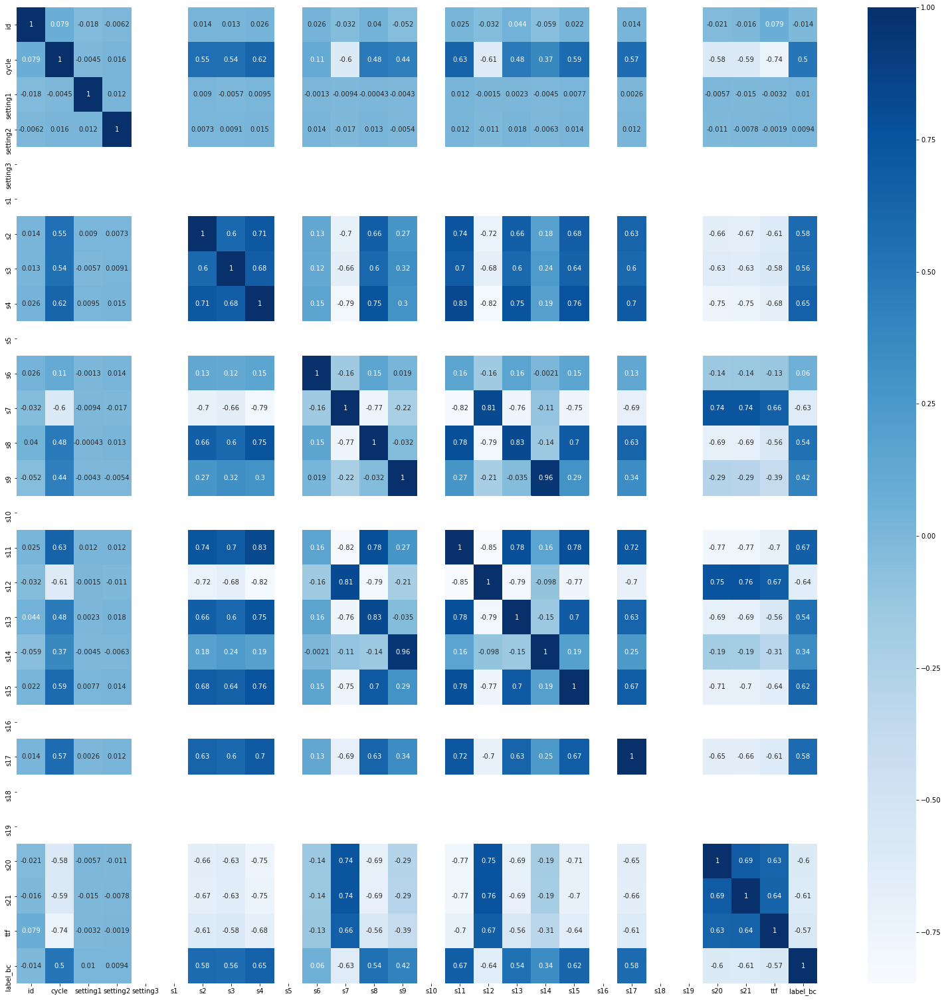

In [131]:
fig, ax = plt.subplots(figsize=(27,27))
sns.heatmap(df_train.corr(), annot=True, cmap='Blues')

In [132]:
x_train = df_train.iloc[:,:-1].values
y_train = df_train.iloc[:,-1:].values

In [133]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(x_train,y_train)

/opt/conda/envs/Python-3.8-main/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/opt/conda/envs/Python-3.8-main/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [134]:
import joblib

In [135]:
joblib.dump(model, "engine_model.sav")

['engine_model.sav']

In [136]:
x_test = df_test.iloc[:,:-1].values
y_test = df_test.iloc[:,-1:].values

In [137]:
y_predlog = model.predict(x_test)

In [138]:
from sklearn.metrics import accuracy_score
accuracy_score(y_predlog,y_test)

0.9993127672571778

In [139]:
df_test['label_bc'].value_counts()

0    12764
1      332
Name: label_bc, dtype: int64

In [140]:
from sklearn.metrics import confusion_matrix
cm1 = confusion_matrix(y_test,y_predlog)
cm1

array([[12763,     1],
       [    8,   324]])

In [141]:
import numpy as np
from sklearn.linear_model import LogisticRegression
import joblib

In [142]:
#### 27 inputs 1 output

In [143]:
##### unit id, cycle, 3-settings, 21 sensor data, ttf(trajectory factor)

In [144]:
inp =[1,1,0.45977,0.166667,0,0,0.183735,0.406802,0.309757,0,1,0.726248,0.242424,0.109755,0,0.369048,0.633262,0.205882,0.199608,0.363986,0,0.333333,0,0,0.713178,0.724662,191]

In [145]:
len(inp)

27

In [146]:
out=0

In [147]:
model = joblib.load("engine_model.sav")

# Manual_Prediction

In [148]:
model.predict([inp])

array([0])

# Sensor_Prediction

In [149]:
import random

In [150]:
inp1=[]
inp1.append(random.randint(0,100)) #id
inp1.append(random.randint(0,365)) #cycle
for i in range(0,24):
    inp1.append(random.uniform(0,1))
inp1.append(random.randint(0,365)) #ttf

In [151]:
len(inp1)

27

In [152]:
model.predict([inp1])

array([0])

In [153]:
!pip install ibm_watson_machine_learning

In [154]:
from ibm_watson_machine_learning import APIClient
wml_credentials = {
    "url": "https://us-south.ml.cloud.ibm.com",
    "apikey": "RChJejuRsWKPUeevfDmNv3Ho-HN9hlejkTGxGW9HIcEE"
}
client = APIClient(wml_credentials)

In [155]:
def guid_from_space_name(client, space_name):
    space = client.spaces.get_details()
    #print(space)
    return(next(item for item in space['resources'] if item['entity']["name"] == space_name)['metadata']['id'])

In [156]:
space_uid = guid_from_space_name(client, 'MINI_PROJECT')
print("Space UID - " + space_uid)

Space UID - 244fcdd7-ae2b-41fd-9977-60dd9ff4c710


In [157]:
client.set.default_space(space_uid)

'SUCCESS'

In [158]:
client.software_specifications.list()

-----------------------------  ------------------------------------  ----
NAME                           ASSET_ID                              TYPE
default_py3.6                  0062b8c9-8b7d-44a0-a9b9-46c416adcbd9  base
pytorch-onnx_1.3-py3.7-edt     069ea134-3346-5748-b513-49120e15d288  base
scikit-learn_0.20-py3.6        09c5a1d0-9c1e-4473-a344-eb7b665ff687  base
spark-mllib_3.0-scala_2.12     09f4cff0-90a7-5899-b9ed-1ef348aebdee  base
ai-function_0.1-py3.6          0cdb0f1e-5376-4f4d-92dd-da3b69aa9bda  base
shiny-r3.6                     0e6e79df-875e-4f24-8ae9-62dcc2148306  base
tensorflow_2.4-py3.7-horovod   1092590a-307d-563d-9b62-4eb7d64b3f22  base
pytorch_1.1-py3.6              10ac12d6-6b30-4ccd-8392-3e922c096a92  base
tensorflow_1.15-py3.6-ddl      111e41b3-de2d-5422-a4d6-bf776828c4b7  base
scikit-learn_0.22-py3.6        154010fa-5b3b-4ac1-82af-4d5ee5abbc85  base
default_r3.6                   1b70aec3-ab34-4b87-8aa0-a4a3c8296a36  base
pytorch-onnx_1.3-py3.6         1bc6029

In [159]:
import sklearn
sklearn.__version__

'0.23.2'

In [160]:
MODEL_NAME = 'AIRCRAFT_ENGINE'
DEPLOYMENT_NAME = 'AIRCRAFT_ENGINE_DEPLOY'
AIRCRAFT_MODEL = model

In [161]:
# Set Python Version
software_spec_uid = client.software_specifications.get_id_by_name('default_py3.8')

# Setup model meta
model_props = {
    client.repository.ModelMetaNames.NAME: MODEL_NAME, 
    client.repository.ModelMetaNames.TYPE: 'scikit-learn_0.23', 
    client.repository.ModelMetaNames.SOFTWARE_SPEC_UID: software_spec_uid 
}



In [162]:
#Save model
model_details = client.repository.store_model(
    model=AIRCRAFT_MODEL, 
    meta_props=model_props, 
    training_data=x_train, 
    training_target=y_train
)

In [163]:
model_details

{'entity': {'label_column': 'l0',
  'software_spec': {'id': 'ab9e1b80-f2ce-592c-a7d2-4f2344f77194',
   'name': 'default_py3.8'},
  'training_data_references': [{'connection': {'access_key_id': 'not_applicable',
     'endpoint_url': 'not_applicable',
     'secret_access_key': 'not_applicable'},
    'id': '1',
    'location': {},
    'schema': {'fields': [{'name': 'f0', 'type': 'float'},
      {'name': 'f1', 'type': 'float'},
      {'name': 'f2', 'type': 'float'},
      {'name': 'f3', 'type': 'float'},
      {'name': 'f4', 'type': 'float'},
      {'name': 'f5', 'type': 'float'},
      {'name': 'f6', 'type': 'float'},
      {'name': 'f7', 'type': 'float'},
      {'name': 'f8', 'type': 'float'},
      {'name': 'f9', 'type': 'float'},
      {'name': 'f10', 'type': 'float'},
      {'name': 'f11', 'type': 'float'},
      {'name': 'f12', 'type': 'float'},
      {'name': 'f13', 'type': 'float'},
      {'name': 'f14', 'type': 'float'},
      {'name': 'f15', 'type': 'float'},
      {'name': 'f16'

In [164]:
model_uid = client.repository.get_model_uid(model_details); model_uid

'2d99dca5-c3de-4a34-8a29-90dd6e1254d6'

In [165]:
client.connections.list_datasource_types()

-------------------------  ------------------------------------  --------  ------
NAME                       DATASOURCE_ID                         TYPE      STATUS
informix                   029e5d1c-ba73-4b09-b742-14c3a39b6cf9  database  active
postgresql-ibmcloud        048ed1bf-516c-46f0-ae90-fa3349d8bc1c  database  active
googlecloudstorage         05b7f0ea-6ae4-45e2-a455-cc280f110825  file      active
impala                     05c58384-862e-4597-b19a-c71ea7e760bc  database  active
salesforce                 06847b16-07b4-4415-a924-c63d11a17aa1  database  active
datastax-ibmcloud          0bd5946b-6fcb-4253-bf76-48b362d24a89  database  active
cosmos                     0c431748-2572-11ea-978f-2e728ce88125  file      active
odbc-datastage             0ca92c3d-0e46-3b42-a573-77958d53c9be  database  active
mysql-compose              0cd4b64c-b485-47ed-a8c4-329c25412de3  database  active
hive                       0fd83fe5-8995-4e2e-a1be-679bb8813a6d  database  active
cognos-analytics

In [170]:
x_train[0]

array([1.00000000e+00, 1.00000000e+00, 4.59770115e-01, 1.66666667e-01,
       0.00000000e+00, 0.00000000e+00, 1.83734940e-01, 4.06801831e-01,
       3.09756921e-01, 0.00000000e+00, 1.00000000e+00, 7.26247987e-01,
       2.42424242e-01, 1.09755003e-01, 0.00000000e+00, 3.69047619e-01,
       6.33262260e-01, 2.05882353e-01, 1.99607803e-01, 3.63986149e-01,
       0.00000000e+00, 3.33333333e-01, 0.00000000e+00, 0.00000000e+00,
       7.13178295e-01, 7.24661696e-01, 1.91000000e+02])

In [171]:
model.predict([[1,2,3,4,5,2,0,4,5,6,1,3,4,6,76,2,4,5,3,3,5,9,8,1,3]])

array([0])